In [1]:
# !pip install icevision[all,dev]

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

## Imports

In [3]:
from icevision.all import *
from fastai.callback.wandb import *
from fastai.callback.tracker import SaveModelCallback
import wandb
from datetime import *


In [4]:
# #Download Datset 
# #Uncomment on first use to download and extract dataset
# from pydrive.auth import GoogleAuth
# from pydrive.drive import GoogleDrive
# from google.colab import auth
# from oauth2client.client import GoogleCredentials

# auth.authenticate_user()
# gauth = GoogleAuth()
# gauth.credentials = GoogleCredentials.get_application_default()
# drive = GoogleDrive(gauth)

# downloaded = drive.CreateFile({'id':"1BCqjhvI9k6h65qM6ZLTwXgdzRVH08tFD"})  
# downloaded.GetContentFile('WSI_PATCHES.7z') 

# #Unpack zip
# !p7zip -d WSI_PATCHES.7z


7-Zip (a) [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 72029910 bytes (69 MiB)

Extracting archive: WSI_PATCHES.7z
--
Path = WSI_PATCHES.7z
Type = 7z
Physical Size = 72029910
Headers Size = 1125
Method = LZMA2:24
Solid = -
Blocks = 38

  0%    
Would you like to replace the existing file:
  Path:     ./WSI_PATCHES/MitosisTest_256/f3741e764d39ccc4d114_151044_12253-13147.png
  Size:     153029 bytes (150 KiB)
  Modified: 2020-11-10 20:18:20
with the file from archive:
  Path:     WSI_PATCHES/MitosisTest_256/f3741e764d39ccc4d114_151044_12253-13147.png
  Size:     153029 bytes (150 KiB)
  Modified: 2020-11-10 20:18:20
? (Y)es / (N)o / (A)lways / (S)kip all / A(u)to rename all / (Q)uit? Q

Archives with Errors: 1



Break signaled


In [5]:
data_dir = Path('./WSI_PATCHES/Mitosis_1class_768_1slide')


In [6]:
parser = parsers.coco(annotations_file=data_dir / "Coco.json",
                     img_dir=data_dir / 'patches',
                     mask=False)

In [7]:
#Parameters

#Class Map
# class_map = ClassMap(['unkown','mitotic figure'])
# class_map = ClassMap(['unkown','granulocyte', 'mitotic figure', 'tumor cell'])
class_map = ClassMap(['unkown','mitotic figure'])


params = dict(
    epochs=80,
    classes=len(class_map),
    class_map=class_map,
    size=384,
    size_trans=512,
    batch_size=5,
    learning_rate=3e-2,
    architecture="CNN",
    model='tf_efficientdet_d2'
    )
params.update(dataset="Mitosis_1Class_"+str(params['size']))
params.update(wandb_run_name = "EffDet_SmallDS_2_" + str(params['size']) +"_"+ date.today().strftime("%m%d%Y"))
params.update(project= 'Mitosis02')
# print(params)

size = params['size']
size_trans = params['size_trans']


In [8]:
# Records
train_records, valid_records = parser.parse()

params.update(train_ds_size=len(train_records))
params.update(valid_ds_size=len(valid_records))

INFO     - Autofixing records | icevision.parsers.parser:parse:124


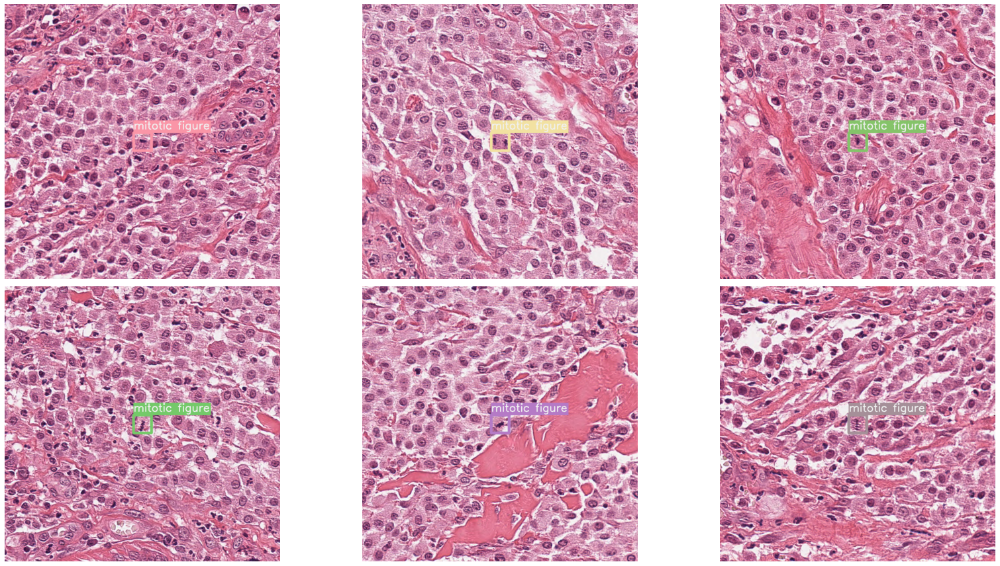

In [9]:
show_records(train_records[:6], ncols=3, class_map=class_map)

In [10]:
# Transforms
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size_trans, presize=size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

In [11]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

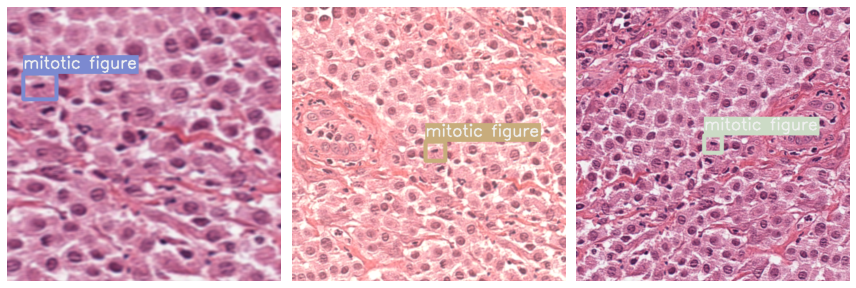

In [12]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3, class_map=class_map)

## DataLoader

In [13]:
# DataLoaders
train_dl = efficientdet.train_dl(train_ds, batch_size=params['batch_size'], num_workers=0, shuffle=True)
valid_dl = efficientdet.valid_dl(valid_ds, batch_size=params['batch_size'], num_workers=0, shuffle=False)

train_dl.batch_size

5

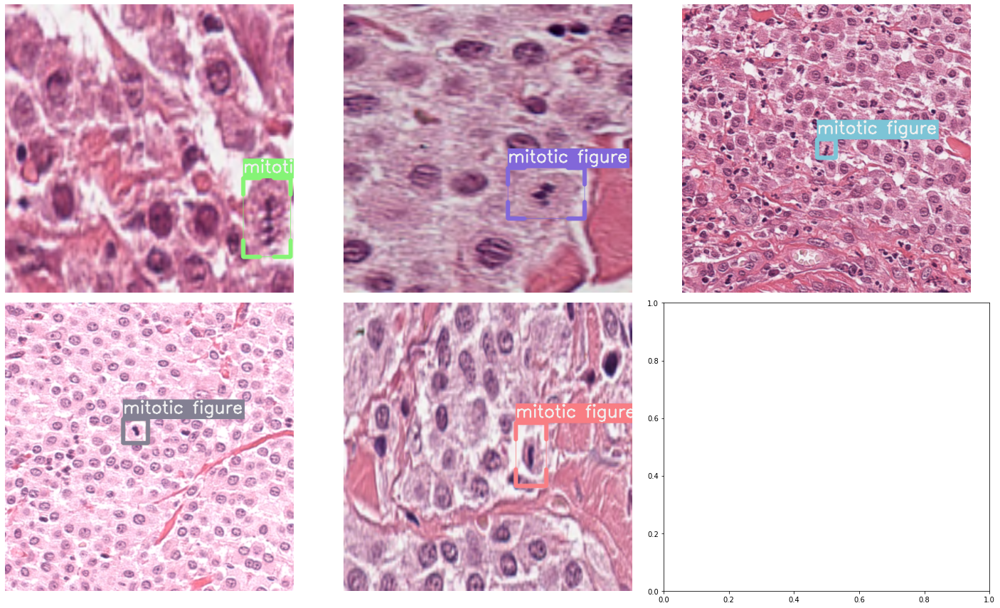

In [14]:
batch, samples = first(train_dl)
show_samples(samples[:6], class_map=class_map, ncols=3)

## Model & Metrics Setup

In [15]:
#Hypermater config for Wandb sweep
sweep_config = {
  "name": params['wandb_run_name'],
  "method": "grid",
  "parameters": {
        'epochs': {
            "values": [params['epochs']]
        },
        'batch_size':{
          'values':[params['batch_size']]
        },
        'learning_rate':{'values':[params['learning_rate']]
        },
        'optimizer': {
            'values': ['adam', 'nadam', 'sgd', 'rmsprop']
        },
        'activation': {
            'values': ['relu', 'elu', 'selu', 'softmax']
        },
        'train_ds_size': {
            'values':[params['train_ds_size']]
        }
    }
}
# sweep_id = wandb.sweep(sweep_config, entity='user', project='mitosis_01')
# print(sweep_config)

In [16]:
#EfficeientDet Model Config
model = efficientdet.model(model_name='tf_efficientdet_d2', 
                           num_classes=len(class_map), 
                           img_size=size_trans)

#Additional Models: tf_efficientdet_lite0

In [17]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [18]:
#WanDB Config
# wandb.init(project=params['project'], name=params['wandb_run_name'], config=params)
# config = wandb.config

<IPython.core.display.Javascript object>

wandb: You can find your API key in your browser here: https://wandb.ai/authorize


wandb: Paste an API key from your profile and hit enter: ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


## Training


In [23]:
learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
# learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], 
#                                     model=model, 
#                                     metrics=metrics,
#                                     cbs=[WandbCallback(log_dataset=False, log_model=False)]
#                                    )

In [24]:
learn.freeze()
# learn.lr_find()

In [25]:
# learn.fine_tune(10, 3e-2, freeze_epochs=10)
learn.fine_tune(60, 3e-2)
# learn.fine_tune(config.epochs, lr=config.learning_rate)

Could not gather input dimensions


TypeError: ignored

In [22]:
learn.freeze()
# learn.lr_find()

In [23]:
learn.fine_tune(10, 3e-7)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.463884,0.548067,0.284606,00:02


epoch,train_loss,valid_loss,COCOMetric,time
0,0.361475,0.548039,0.268629,00:03
1,0.383984,0.529406,0.267217,00:03
2,0.407457,0.519648,0.284841,00:03
3,0.414620,0.520036,0.274274,00:03
4,0.417152,0.515573,0.285066,00:03
5,0.389530,0.494841,0.268800,00:03
6,0.414753,0.494075,0.275196,00:03
7,0.429759,0.515901,0.264632,00:03
8,0.422871,0.497973,0.263404,00:03
9,0.433354,0.475815,0.261097,00:03


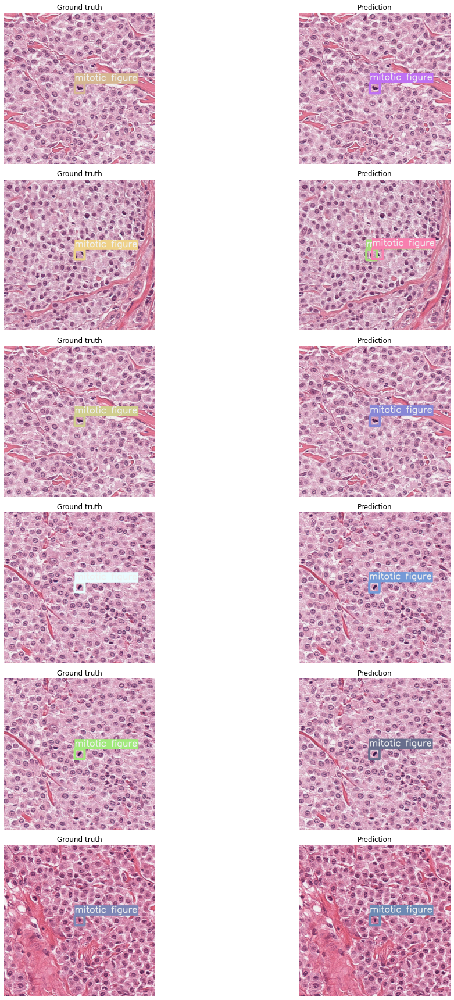

In [24]:
efficientdet.show_results(model, valid_ds, class_map=class_map)

In [25]:
valid_test_dl = efficientdet.infer_dl(valid_ds, batch_size=params['batch_size'])
samples, preds = efficientdet.predict_dl(model, valid_test_dl)

In [26]:
# wandb_images = wandb_img_preds(samples, preds, class_map, add_ground_truth=True) 

In [27]:
# wandb.log({"Predicted images": wandb_images})
# wandb.join()

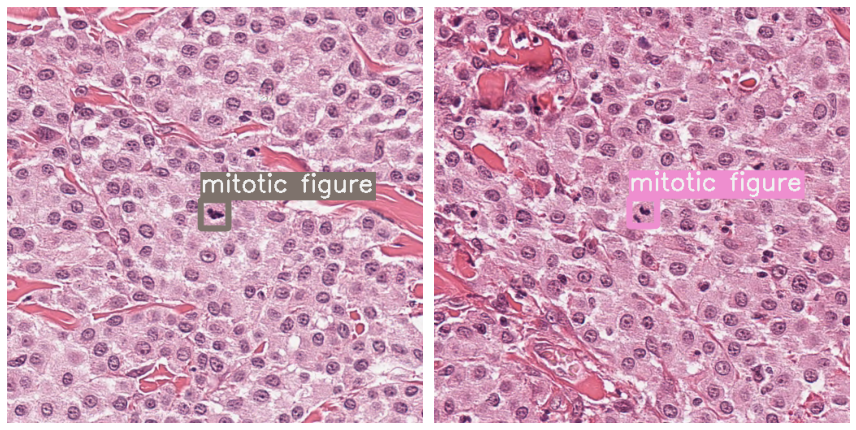

In [28]:
# Show inference on validation dataset
imgs = [sample["img"] for sample in samples]
imgs=imgs[:2]
show_preds(
    imgs,
    preds=preds[:2],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [ ]:
#Save model weights
torch.save(model.state_dict(), data_dir/'mitosis_tf_efficientdet_lite0.pth')

## Prediction from Saved Model

In [29]:
print(class_map)

<ClassMap: {'background': 0, 'unkown': 1, 'mitotic figure': 2}>


In [30]:
#Load Test Patches
import os
# directory = './WSI_PATCHES/MitosisTest_1024'
# directory = './WSI_PATCHES/MitosisTest_256'
directory = './WSI_PATCHES/MitosisTest_768'
# directory = '/home/bnapora/development/ml-pipeline/WSI_PATCHES/Mitosis01_256/test_patches_1024'
images = []

for filename in os.listdir(directory):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        imgfile = os.path.join(directory, filename)
        images.append(open_img(imgfile))
    else:
        continue
images = np.array(images)
images.shape

(2, 768, 768, 3)

In [31]:
print('size=',size)
print('size_trans=',size_trans)

size= 384
size_trans= 512


In [32]:
#Transforms used on train/valid ds
# valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])
infer_ds = Dataset.from_images(images, test_tfms)

In [33]:
#Load Saved Model
model2 = efficientdet.model(model_name='tf_efficientdet_d2', 
                           num_classes=len(class_map), 
                           img_size=size_trans)
state_dict = torch.load(data_dir/'mitosis_tf_efficientdet_lite0.pth')
model2.load_state_dict(state_dict)
# model2.cpu()  #Don't seem to need to indicate cpu()

<All keys matched successfully>

In [34]:
infer_dl = efficientdet.infer_dl(infer_ds, batch_size=1)
samples_inf, preds_inf = efficientdet.predict_dl(model=model2, infer_dl=infer_dl)

In [35]:
# Check to see if predicitons were made
# preds_inf

(512, 512, 3)


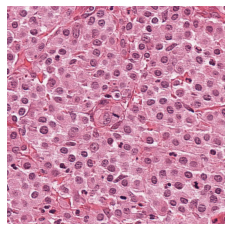

In [36]:
for sample in samples_inf:
    imgs = sample['img']
print(imgs.shape)
show_sample(samples_inf[0])

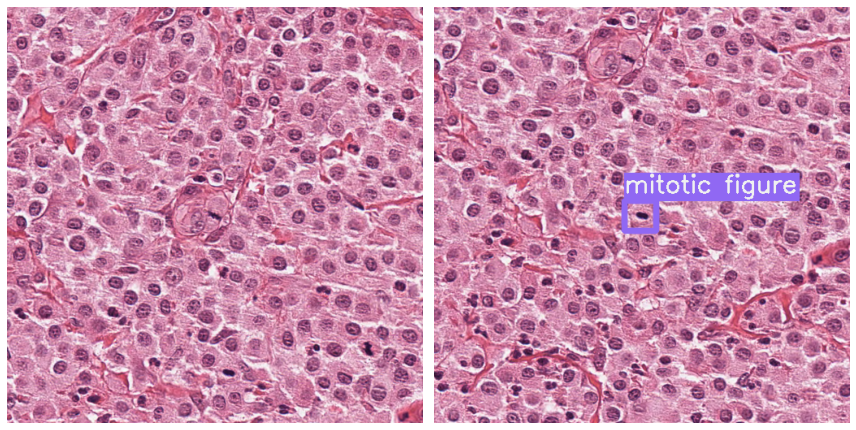

In [37]:
# Show samples
imgs = [sample["img"] for sample in samples_inf]
imgs=imgs[:4]
show_preds(
    imgs,
    preds=preds_inf[:4],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)